# pyannote2.0 - Trained pipeline_embed AMI TestSet DER 21.4%

In [2]:
# !pip install https://github.com/pyannote/pyannote-audio/archive/develop.zip
# !wget -q http://groups.inf.ed.ac.uk/ami/AMICorpusMirror/amicorpus/ES2014a/audio/ES2014a.Mix-Headset.wav
# !wget -q https://raw.githubusercontent.com/pyannote/pyannote-audio/master/tutorials/data_preparation/AMI/MixHeadset.test.rttm

# Paper at https://arxiv.org/pdf/1911.01255.pdf
# manual annotations (a.k.a groundtruth) in rttm file
!ls

DEMO_FILE = {'uri': 'afjiv', 'audio': 'afjiv.wav'}
RTTM_FILE = 'afjiv.rttm'
# RTTM_FILE = 'MixHeadset.test.rttm'

 20220401_0622_917898941431_11009471.mp3
 20220401_0622_917898941431_11009471.wav
 DH_0001.flac
 ES2004a.Mix-Headset.rttm
 ES2004a.Mix-Headset.wav
 MixHeadset.test.rttm
'Streaming voice activity detection .ipynb'
 afjiv.rttm
 afjiv.wav
 embeddin.ipynb
 hypothesis
 pretrained_models
'pyannote -SD v2.ipynb'
'pyannote2.0 - Trained pipeline_embed AMI TestSet DER(21.4).ipynb'
'pyannote_v2-audio only.ipynb'


In [8]:
from huggingface_hub import HfApi
available_pipelines = [p.modelId for p in HfApi().list_models(filter="pyannote-audio-pipeline")]
available_pipelines

['pyannote/speaker-diarization',
 'pyannote/voice-activity-detection',
 'pyannote/overlapped-speech-detection',
 'pyannote/speaker-segmentation']

In [3]:
from IPython.display import Audio

# load audio waveform
Audio(DEMO_FILE['audio'], rate=16000, autoplay=True)


/usr/lib/python3/dist-packages/requests/__init__.py:89: RequestsDependencyWarning: urllib3 (1.26.10) or chardet (3.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


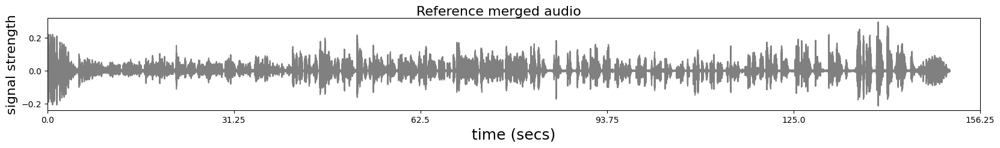

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import librosa

sr = 16000
signal, sr = librosa.load(DEMO_FILE['audio'],sr=sr) 

# plot and listen to the audio and visualize the tracks
fig,ax = plt.subplots(1,1)
fig.set_figwidth(20)
fig.set_figheight(2)
plt.plot(np.arange(len(signal)),signal,'gray')
fig.suptitle('Reference merged audio', fontsize=16)
plt.xlabel('time (secs)', fontsize=18)
ax.margins(x=0)
plt.ylabel('signal strength', fontsize=16);
a,_ = plt.xticks();plt.xticks(a,a/sr);
plt.show()


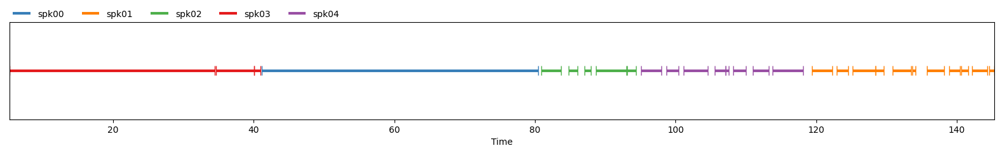

In [5]:
# load groundtruth
from pyannote.database.util import load_rttm

groundtruth = load_rttm(RTTM_FILE) # this is a dict for groundtruth rttm db
groundtruth = groundtruth[DEMO_FILE['uri']] # get groundtruth of DEMO_FILE

# visualize groundtruth
groundtruth
# This nice visualization is by pyannote.core and basically indicates when each speaker speaks.
# SPEAKER {file_name} 1 {start_time} {duration} <NA> <NA> {speaker_name} <NA> <NA>

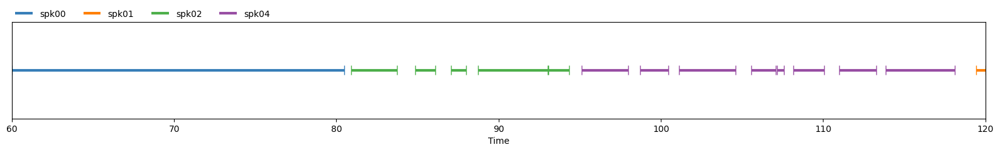

In [6]:
from pyannote.core import Segment, notebook
# make notebook visualization zoom on 60s < t < 120s time range
EXCERPT = Segment(60, 120)
notebook.crop = EXCERPT

# visualize excerpt from groundtruth
groundtruth

In [44]:
# loading the SD model from huggingface
from pyannote.audio import Pipeline
pipeline2 = Pipeline.from_pretrained("pyannote/speaker-diarization")


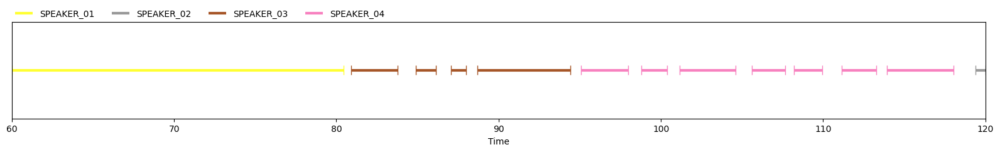

In [48]:
# apply pretrained pipeline
diarization2 = pipeline2(DEMO_FILE)
diarization2

In [51]:
import os
ROOT = os.getcwd()
out_dir = os.path.join(ROOT,'hypothesis')
os.makedirs(out_dir, exist_ok=True)

OUT_RTTM = os.path.join(out_dir, "h_"+RTTM_FILE)
with open(OUT_RTTM, 'w') as file:
    diarization2.write_rttm(file)


diarization error rate 2 = 2.5%


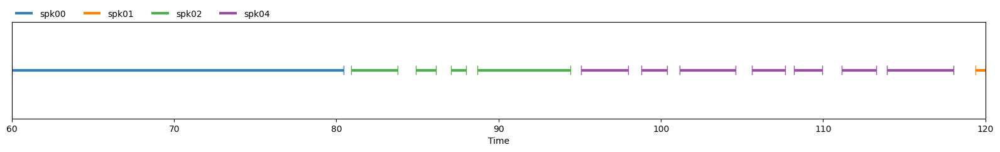

In [52]:
# DER by finding optimal one-to-one mapping between groundtruth and hypothesized speakers.
from pyannote.metrics.diarization import DiarizationErrorRate

metric2 = DiarizationErrorRate()
der2 = metric2(groundtruth, diarization2)
print(f'diarization error rate 2 = {100 * der2:.1f}%')


mapping = metric2.optimal_mapping(groundtruth, diarization2)
diarization2 = diarization2.rename_labels(mapping=mapping)
diarization2

In [9]:
# Overlap detection in audio
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained("pyannote/overlapped-speech-detection")
output = pipeline(DEMO_FILE['audio']).get_timeline()


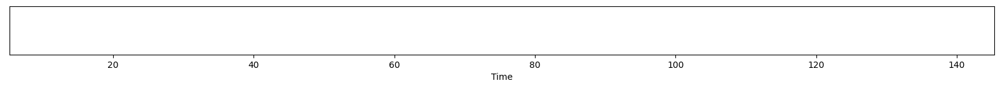

In [10]:
output

## visualisation of speakers second by second

In [7]:
import math
import time

def secondwise_speaker_iter(annotation):
    total_time = 0   
    timelines = annotation.get_timeline()

    speaker_dict = {}
    # print the result
    for turn, _, speaker in annotation.itertracks(yield_label=True):
#         print(f"start={turn.start:.1f}s stop={turn.end:.1f}s speaker_{speaker}")
        total_time = max(total_time, math.ceil(turn.end))
        
        for t in range(math.ceil(turn.start), math.ceil(turn.end)):
            if t not in speaker_dict.keys():
                speaker_dict[t] = [speaker]
            else:
                speaker_dict[t].append(speaker)
    return speaker_dict, total_time

def print_secondwise_speaker(annotation, time_step=1):
    print("Starting with delay of 1 s (Click on Audio above)...")
    print()
    
    time.sleep(time_step)
    
    speaker_dict, total_time = secondwise_speaker_iter(annotation)
    elapsed = 0
    print_list = []
    while(elapsed < total_time):
        time.sleep(time_step)
        elapsed += time_step
        if elapsed in speaker_dict.keys():
            print_list.append(speaker_dict[elapsed])
            print(f"\rAt: {elapsed:03d}s Speaker: {print_list[-1]}\t\t\t\t\t\t\t\t\t\t\t", end="")


In [8]:
from IPython.display import Audio

# load audio waveform
Audio(DEMO_FILE['audio'], rate=16000)

In [9]:
print_secondwise_speaker(diarization2)

NameError: name 'diarization2' is not defined

## visualise speaker embeddings

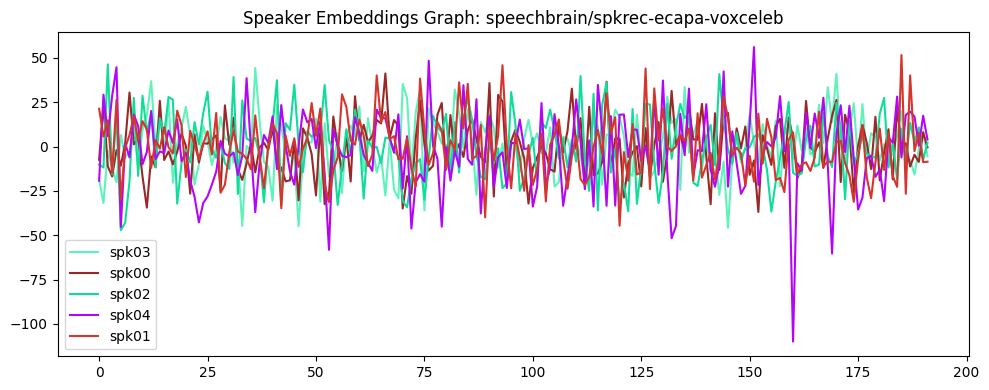

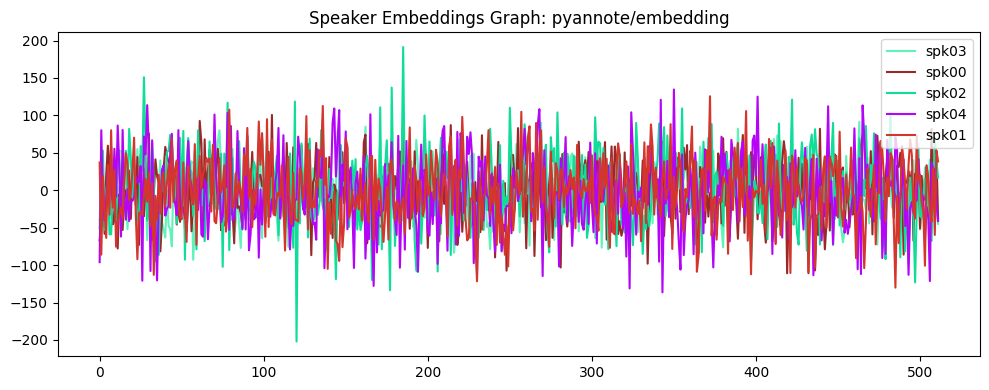

In [175]:
import numpy as np
import matplotlib.pyplot as plt
from pyannote.audio import Inference
from pyannote.core import Segment
inference = Inference("pyannote/embedding", window="whole", device="cuda")

import torch
from pyannote.audio.pipelines.speaker_verification import PretrainedSpeakerEmbedding
from pyannote.audio import Audio
from pyannote.core import Segment
audio = Audio(sample_rate=16000, mono=True)


def get_speakers_embedding(annotation, plot=True, embed_model="speechbrain/spkrec-ecapa-voxceleb"):
    """
    get single segments for each speaker, and return their embeddings
    `embedding` is (1 x D) numpy array extracted from the file excerpt.
    
    embed_model = ["speechbrain/spkrec-ecapa-voxceleb", "pyannote/embedding"]

    """
    model = PretrainedSpeakerEmbedding(
        embed_model,
        device=torch.device("cuda")
    )
    
    speaker_segments = {}
    speaker_embeds = {}

    for turn, _, speaker in annotation.itertracks(yield_label=True):
        # print(f"start={turn.start:.1f}s stop={turn.end:.1f}s speaker={speaker}")
        if not speaker in speaker_segments.keys():
            speaker_segments[speaker] = (turn.start, turn.end)

    
    for speaker, turn in speaker_segments.items():
        # extract embedding for a speaker speaking between turns
        excerpt = Segment(turn[0], turn[1])
        excerpt_waveform, excerpt_sr = audio.crop(DEMO_FILE['audio'], excerpt)
        embed = model(excerpt_waveform[None])
        speaker_embeds[speaker] = embed[0] #TODO: explore it to be 2d by running on complete audio
        
        
    # Speaker spk00 embed shape:(512,)
    # print("ss",speaker_segments)
    # print("se", speaker_embeds)
    if plot == True:
        plt.rcParams["figure.figsize"] = [10, 4]
        plt.rcParams["figure.autolayout"] = True
        
        np.random.seed(42)
        x = np.arange(0,len(speaker_embeds[speaker]))
        plt.title(f"Speaker Embeddings Graph: {embed_model}")

        
        for speaker, embed in speaker_embeds.items():
            plt.plot(x, embed, color=np.random.rand(3,))
        plt.legend(speaker_embeds.keys())
        plt.show()
        
    return speaker_embeds   


        
speaker_embeds = get_speakers_embedding(annotation = diarization2, plot=True)
speaker_embeds1 = get_speakers_embedding(annotation = diarization2, plot=True, embed_model="pyannote/embedding")



In [142]:

# compare embeddings using "cosine" distance
from scipy.spatial.distance import cdist
distance = cdist([speaker_embeds['spk00']], [speaker_embeds['spk01']], metric="cosine")
distance

array([[0.88710731]])

'#123846'

## Data preparation and pipeline train

In [53]:
# Setup from BUT https://github.com/pyannote/AMI-diarization-setup
# tell pyannote.database where to find partition, reference, and wav files
import os
BASE_DIR = os.getcwd()
env_path = os.path.join(BASE_DIR, '../../AMI-diarization-setup/pyannote/database.yml')
os.environ["PYANNOTE_DATABASE_CONFIG"] = env_path
print(f'PYANNOTE_DATABASE_CONFIG = {os.environ["PYANNOTE_DATABASE_CONFIG"]}')


# used to automatically find paths to wav files
from pyannote.database import FileFinder
preprocessors = {'audio': FileFinder()}

# initialize 'only_words' experimental protocol
from pyannote.database import get_protocol
ami = get_protocol('AMI.SpeakerDiarization.only_words', preprocessors=preprocessors)

# iterate over the training set
for file in ami.train():
    # IS1000a, [ 00:00:37.250 -->  00:00:38.010] 0 spk1, path
    meeting = file['uri']
    reference = file['annotation']
    path = file['audio']

# iterate over the development set
for file in ami.development():
    pass

# iterate over the test set
for file in ami.test():
    pass

# initialize 'word_and_vocalsounds' experimental protocol
word_and_vocalsounds = get_protocol('AMI.SpeakerDiarization.word_and_vocalsounds')


# !nvidia-smi

# pyannote.database protocols usually define:
# a training set: for training_file in protocol.train(): ...,
# a validation set: for validation_file in protocol.development(): ...
# an evaluation set for evaluation_file in protocol.test(): ...
# Let's listen to one minute of the first training file...

# first_training_file = next(ami.train())
# reference = first_training_file["annotation"]
# from pyannote.audio.utils.preview import listen
# from pyannote.core import Segment
# one_minute = Segment(240, 300)
# listen(first_training_file, one_minute)

PYANNOTE_DATABASE_CONFIG = /home/DATA/amit_kesari/SD1/pyannote-v2/../../AMI-diarization-setup/pyannote/database.yml


In [87]:
# from pyannote.audio import Pipeline
# pipeline2 = Pipeline.from_pretrained("pyannote/speaker-diarization")
# diarization2 = pipeline2(DEMO_FILE)

from pyannote.pipeline import Optimizer

# initial_params = {"onset": 0.6, "offset": 0.4, "min_duration_on": 0.0, "min_duration_off": 0.0}
# parameters optimized on DIHARD 3 development set
initial_params = {
    'stitch_threshold': 0.04033955907446252,
    'onset': 0.8104268538848918,
    'offset': 0.4806866463041527,
    'min_duration_on': 0.05537587440407595,
    'min_duration_off': 0.09791355693027545,
    'min_activity': 6.073193238899291,
    'clustering': {'threshold': 0.582398766878762, 'method': 'average'}}

# pipeline2.freeze({'min_duration_on': 0.0, 'min_duration_off': 0.0})

optimizer = Optimizer(pipeline2)
optimizer.tune(list(ami.train()), 
               warm_start=initial_params, 
               n_iterations=2, 
               show_progress=True)

optimized_params = optimizer.best_params
print(f"Best Loss : {optimizer.best_loss}")


Current trial: 100%|██████████| 136/136 [4:22:17<00:00, 182.85s/it]
                                                                   
Current trial: 100%|██████████| 136/136 [3:46:38<00:00, 215.94s/it]
                                                                   

Best Loss : 0.20744861694034658


In [89]:
# obtained from training above
optimized_params

{'stitch_threshold': 0.04033955907446252,
 'onset': 0.8104268538848918,
 'offset': 0.4806866463041527,
 'min_duration_on': 0.05537587440407595,
 'min_duration_off': 0.09791355693027545,
 'min_activity': 6.073193238899291,
 'clustering': {'threshold': 0.582398766878762, 'method': 'average'}}

In [90]:
# use the new optimised values
optimized_pipeline = pipeline2.instantiate(optimized_params)

# DER by finding optimal one-to-one mapping between groundtruth and hypothesized speakers.
from pyannote.metrics.diarization import DiarizationErrorRate
metric2 = DiarizationErrorRate()

# getting DER over all the test set
for file in ami.test():
    speech = optimized_pipeline(file)
    _ = metric2(file['annotation'], speech, uem=file['annotated'])
    
der2 = abs(metric2)
print(f'diarization error rate 2 = {100 * der2:.1f}%')


diarization error rate 2 = 21.4%


{'pipeline': <pyannote.audio.pipelines.speaker_diarization.SpeakerDiarization at 0x7fd63cfbcca0>,
 'db': None,
 'storage_': None,
 'study_name': None,
 'sampler': <optuna.samplers._tpe.sampler.TPESampler at 0x7fd63c9d2880>,
 'pruner': None,
 'study_': <optuna.study.study.Study at 0x7fd63cae9a30>}

In [36]:
# TODO
from pyannote.audio.pipelines import SpeakerDiarization

CONFIG = {
    "segmentation": "pyannote/segmentation",
    "embedding": "speechbrain/spkrec-ecapa-voxceleb",
    "clustering": "AgglomerativeClustering"
}
PARAMS = {
    "onset": 0.5, "offset": 0.5,
    "stitch_threshold": 0.04, "min_activity": 6.0,
    "clustering": {"method": "average", "threshold": 0.595}
}

pipeline = SpeakerDiarization(**CONFIG).instantiate(PARAMS)
dia = pipeline("afjiv.wav") #  The duration of the wav file 15s.
dia


# vs
# pipeline:
#   name: pyannote.audio.pipelines.SpeakerDiarization
#   params:
#     segmentation: pyannote/segmentation
#     embedding: speechbrain/spkrec-ecapa-voxceleb
#     clustering: AgglomerativeClustering


RuntimeError: A pipeline must be instantiated with `pipeline.instantiate(parameters)` before it can be applied.